In [4]:
import pandas as pd
import os
import glob
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder,LabelEncoder
from sklearn.metrics import precision_score, recall_score, f1_score, roc_curve, roc_auc_score, auc
import shutil
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image
import random
from tensorflow.keras.models import load_model

In [8]:
path = '/Users/jacar/OneDrive/Documentos/Maestria/Ciencia de datos aplicada/Talleres/Taller-2/GroceryStoreDataset-master/dataset/train' 
path_test = '/Users/jacar/OneDrive/Documentos/Maestria/Ciencia de datos aplicada/Talleres/Taller-2/GroceryStoreDataset-master/dataset/test' 

path_destino = '/Users/jacar/OneDrive/Documentos/Maestria/Ciencia de datos aplicada/Talleres/Taller-2/GroceryStoreDataset-master/dataset/train_modi/' 
path_de_test = '/Users/jacar/OneDrive/Documentos/Maestria/Ciencia de datos aplicada/Talleres/Taller-2/GroceryStoreDataset-master/dataset/test_modi/' 

In [9]:
def imagen_90 (i):
    imagen = Image.open(i)
    imagen_rgb = imagen.convert('RGB')
    x = imagen_rgb.rotate(90)
    return x

def imagen_hor (i):
    imagen = Image.open(i)
    imagen_rgb = imagen.convert('RGB')
    x = imagen_rgb.transpose(Image.FLIP_LEFT_RIGHT)
    return x

def imagen_ver (i):
    imagen = Image.open(i)
    imagen_rgb = imagen.convert('RGB')
    x = imagen_rgb.transpose(Image.FLIP_TOP_BOTTOM)
    return x

In [10]:
def cambio_carpetas(path,path_destino):
    imagenes=[]
    for directorio, subdirectorios, archivos in os.walk(path):
        for archivo in archivos:
            if archivo.endswith('.jpg') or archivo.endswith('.png'):
                archivo_path = os.path.join(directorio, archivo)
                imagenes.append(archivo_path)
    for i in imagenes :
        if path != path_test :
            #print(i.replace(path,"").split('/')[2])
            #print(i.replace(path,"").split('/')[-1].split('_')[0])
            if i.replace(path,"").split('\\')[3] == i.replace(path,"").split('\\')[-1].split('_')[0]:
                ruta = path_destino+i.replace(path,"").split('\\')[-1].split('_')[0]+'/'
                if not os.path.exists(ruta):
                    os.makedirs(ruta)
                    shutil.copy(i,ruta)
                    x = imagen_90(i)
                    x.save(ruta+i.replace(path,"").split('\\')[-1].split('.')[0]+'_90.'+i.replace(path,"").split('\\')[-1].split('.')[1])
                    x = imagen_hor(i)
                    x.save(ruta+i.replace(path,"").split('\\')[-1].split('.')[0]+'_hor.'+i.replace(path,"").split('\\')[-1].split('.')[1])
                    x = imagen_ver(i)
                    x.save(ruta+i.replace(path,"").split('\\')[-1].split('.')[0]+'_ver.'+i.replace(path,"").split('\\')[-1].split('.')[1])
                else :
                    shutil.copy(i,ruta)
                    x = imagen_90(i)
                    x.save(ruta+i.replace(path,"").split('\\')[-1].split('.')[0]+'_90.'+i.replace(path,"").split('\\')[-1].split('.')[1])
                    x = imagen_hor(i)
                    x.save(ruta+i.replace(path,"").split('\\')[-1].split('.')[0]+'_hor.'+i.replace(path,"").split('\\')[-1].split('.')[1])
                    x = imagen_ver(i)
                    x.save(ruta+i.replace(path,"").split('\\')[-1].split('.')[0]+'_ver.'+i.replace(path,"").split('\\')[-1].split('.')[1])
                    
            else : 
                ruta = path_destino+i.replace(path,"").split('\\')[3].split('_')[0]+'/'
                if not os.path.exists(ruta):
                    os.makedirs(ruta)
                    shutil.copy(i,ruta)
                    x = imagen_90(i)
                    x.save(ruta+i.replace(path,"").split('\\')[-1].split('.')[0]+'_90.'+i.replace(path,"").split('\\')[-1].split('.')[1])
                    x = imagen_hor(i)
                    x.save(ruta+i.replace(path,"").split('\\')[-1].split('.')[0]+'_hor.'+i.replace(path,"").split('\\')[-1].split('.')[1])
                    x = imagen_ver(i)
                    x.save(ruta+i.replace(path,"").split('\\')[-1].split('.')[0]+'_ver.'+i.replace(path,"").split('\\')[-1].split('.')[1])
                else :
                    shutil.copy(i,ruta)
                    x = imagen_90(i)
                    x.save(ruta+i.replace(path,"").split('\\')[-1].split('.')[0]+'_90.'+i.replace(path,"").split('\\')[-1].split('.')[1])
                    x = imagen_hor(i)
                    x.save(ruta+i.replace(path,"").split('\\')[-1].split('.')[0]+'_hor.'+i.replace(path,"").split('\\')[-1].split('.')[1])
                    x = imagen_ver(i)
                    x.save(ruta+i.replace(path,"").split('\\')[-1].split('.')[0]+'_ver.'+i.replace(path,"").split('\\')[-1].split('.')[1])
        else : 
            if i.replace(path,"").split('\\')[3] == i.replace(path,"").split('\\')[-1].split('_')[0]:
                ruta = path_destino+i.replace(path,"").split('\\')[-1].split('_')[0]+'/'
                if not os.path.exists(ruta):
                    os.makedirs(ruta)
                    shutil.copy(i,ruta)
                else :
                    shutil.copy(i,ruta)
                
            else : 
                ruta = path_destino+i.replace(path,"").split('\\')[3].split('_')[0]+'/'
                if not os.path.exists(ruta):
                    os.makedirs(ruta)
                    shutil.copy(i,ruta)
                else :
                    shutil.copy(i,ruta)

In [11]:
cambio_carpetas(path,path_destino)
cambio_carpetas(path_test,path_de_test)

In [17]:
train_datagen = ImageDataGenerator(rescale=1./255, 
                                   rotation_range=20, 
                                   width_shift_range=0.2, 
                                   height_shift_range=0.2, 
                                   shear_range=0.2, 
                                   zoom_range=0.2, 
                                   horizontal_flip=True, 
                                   fill_mode='nearest')

In [18]:
img_height = 348
img_width = 348
batch_size = 32

In [19]:
train_generator = train_datagen.flow_from_directory(
    path_destino,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical') 

Found 10560 images belonging to 81 classes.


In [20]:
val_datagen = ImageDataGenerator(rescale=1./255)

In [21]:
val_generator = val_datagen.flow_from_directory(
    path_de_test,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical') 

Found 2485 images belonging to 81 classes.


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator


base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

for layer in base_model.layers[:100]:
    layer.trainable = False

for layer in base_model.layers[100:]:
    layer.trainable = True

model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(81, activation='softmax') 
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])


model.summary()

C:\Users\jacar\AppData\Local\Temp\ipykernel_4560\1244231325.py:8: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 11, 11, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 81)             │        41,553 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,955,409 (11.27 MB)

 Trainable params: 2,558,865 (9.76 MB)

 Non-trainable params: 396,544 (1.51 MB)

In [14]:
history = model.fit(
    train_generator,
    epochs=15,
    validation_data=val_generator
)

c:\Users\jacar\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 509s 2s/step - accuracy: 0.2928 - loss: 3.1033 - val_accuracy: 0.4495 - val_loss: 1.9015
Epoch 2/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 452s 1s/step - accuracy: 0.8778 - loss: 0.4879 - val_accuracy: 0.6346 - val_loss: 1.1918
Epoch 3/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 451s 1s/step - accuracy: 0.9600 - loss: 0.1730 - val_accuracy: 0.7103 - val_loss: 1.0009
Epoch 4/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 447s 1s/step - accuracy: 0.9758 - loss: 0.0996 - val_accuracy: 0.8036 - val_loss: 0.7109
Epoch 5/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 445s 1s/step - accuracy: 0.9861 - loss: 0.0650 - val_accuracy: 0.7924 - val_loss: 0.8810
Epoch 6/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 444s 1s/step - accuracy: 0.9924 - loss: 0.0383 - val_accuracy: 0.8217 - val_loss: 0.7035
Epoch 7/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 444s 1s/step - accuracy: 0.9919 - loss: 0.0370 - val_accuracy: 0.8105 - val_loss: 1.0308
Epoch 8/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 444s 1s/step - accuracy: 0.9918 - loss: 0.0327 - val_accu

In [15]:
model.save('Model_final_v2.h5')

In [5]:
model = load_model("/Users/jacar/OneDrive/Documentos/Maestria/Ciencia de datos aplicada/Talleres/Taller-2/Model_final_v2.h5")

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 11, 11, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 81)             │        41,553 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,955,411 (11.27 MB)

 Trainable params: 2,558,865 (9.76 MB)

 Non-trainable params: 396,544 (1.51 MB)

 Optimizer params: 2 (12.00 B)

In [16]:
score = model.evaluate(val_generator, verbose=1)
print(f'Pérdida: {score[0]}, Precisión: {score[1]}')

78/78 ━━━━━━━━━━━━━━━━━━━━ 42s 541ms/step - accuracy: 0.8705 - loss: 0.8643
Pérdida: 0.9553526043891907, Precisión: 0.8583500981330872


In [22]:

X_test = []
y_test = []

for i in range(len(val_generator)):
    batch_x, batch_y = next(val_generator)
    X_test.append(batch_x)
    y_test.append(batch_y)


X_test = np.concatenate(X_test, axis=0)
y_test = np.concatenate(y_test, axis=0)

print("Forma de X_test:", X_test.shape)  
print("Forma de y_test:", y_test.shape) 

Forma de X_test: (2485, 348, 348, 3)
Forma de y_test: (2485, 81)


In [23]:
y_test = np.argmax(y_test, axis=1)

In [24]:
y_pred = model.predict(X_test)

78/78 ━━━━━━━━━━━━━━━━━━━━ 43s 542ms/step


In [25]:
y_pred = np.argmax(y_pred, axis=1)

In [26]:
print("Precision:")
print("- Test:", precision_score(y_test, y_pred, average='weighted'))
print("\nRecall:")
print("- Test:", recall_score(y_test, y_pred, average='weighted'))
print("\nF1:")
print("- Test:", f1_score(y_test, y_pred, average='weighted'))


Precision:
- Test: 0.8813739467543202

Recall:
- Test: 0.8583501006036217

F1:
- Test: 0.8538707702336442


In [27]:
class_names = val_generator.class_indices
print(class_names)

{'Alpro-Blueberry-Soyghurt': 0, 'Alpro-Fresh-Soy-Milk': 1, 'Alpro-Shelf-Soy-Milk': 2, 'Alpro-Vanilla-Soyghurt': 3, 'Anjou': 4, 'Arla-Ecological-Medium-Fat-Milk': 5, 'Arla-Ecological-Sour-Cream': 6, 'Arla-Lactose-Medium-Fat-Milk': 7, 'Arla-Medium-Fat-Milk': 8, 'Arla-Mild-Vanilla-Yoghurt': 9, 'Arla-Natural-Mild-Low-Fat-Yoghurt': 10, 'Arla-Natural-Yoghurt': 11, 'Arla-Sour-Cream': 12, 'Arla-Sour-Milk': 13, 'Arla-Standard-Milk': 14, 'Asparagus': 15, 'Aubergine': 16, 'Avocado': 17, 'Banana': 18, 'Beef-Tomato': 19, 'Bravo-Apple-Juice': 20, 'Bravo-Orange-Juice': 21, 'Brown-Cap-Mushroom': 22, 'Cabbage': 23, 'Cantaloupe': 24, 'Carrots': 25, 'Conference': 26, 'Cucumber': 27, 'Floury-Potato': 28, 'Galia-Melon': 29, 'Garant-Ecological-Medium-Fat-Milk': 30, 'Garant-Ecological-Standard-Milk': 31, 'Garlic': 32, 'Ginger': 33, 'God-Morgon-Apple-Juice': 34, 'God-Morgon-Orange-Juice': 35, 'God-Morgon-Orange-Red-Grapefruit-Juice': 36, 'God-Morgon-Red-Grapefruit-Juice': 37, 'Golden-Delicious': 38, 'Granny-S

In [28]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred,target_names=list(class_names)))

                                        precision    recall  f1-score   support

              Alpro-Blueberry-Soyghurt       0.93      0.93      0.93        28
                  Alpro-Fresh-Soy-Milk       1.00      1.00      1.00        28
                  Alpro-Shelf-Soy-Milk       1.00      1.00      1.00        30
                Alpro-Vanilla-Soyghurt       0.89      0.89      0.89        19
                                 Anjou       0.79      0.86      0.82        35
       Arla-Ecological-Medium-Fat-Milk       0.97      0.97      0.97        29
            Arla-Ecological-Sour-Cream       1.00      0.83      0.90        23
          Arla-Lactose-Medium-Fat-Milk       1.00      1.00      1.00        25
                  Arla-Medium-Fat-Milk       0.97      0.88      0.92        34
             Arla-Mild-Vanilla-Yoghurt       1.00      1.00      1.00        27
     Arla-Natural-Mild-Low-Fat-Yoghurt       1.00      0.96      0.98        23
                  Arla-Natural-Yoghurt 

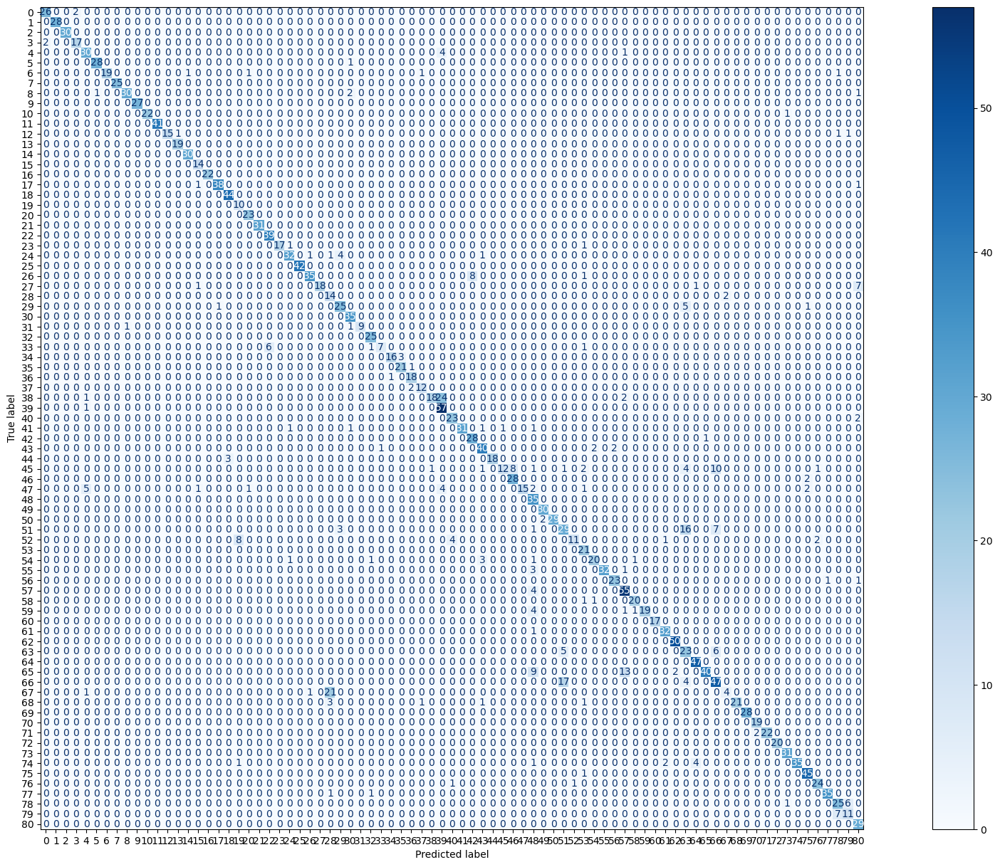

In [24]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix


cfn_matrix  = confusion_matrix(y_test, y_pred)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = cfn_matrix)
fig, ax = plt.subplots(figsize=(25, 15))
cm_display.plot(ax=ax, cmap='Blues')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


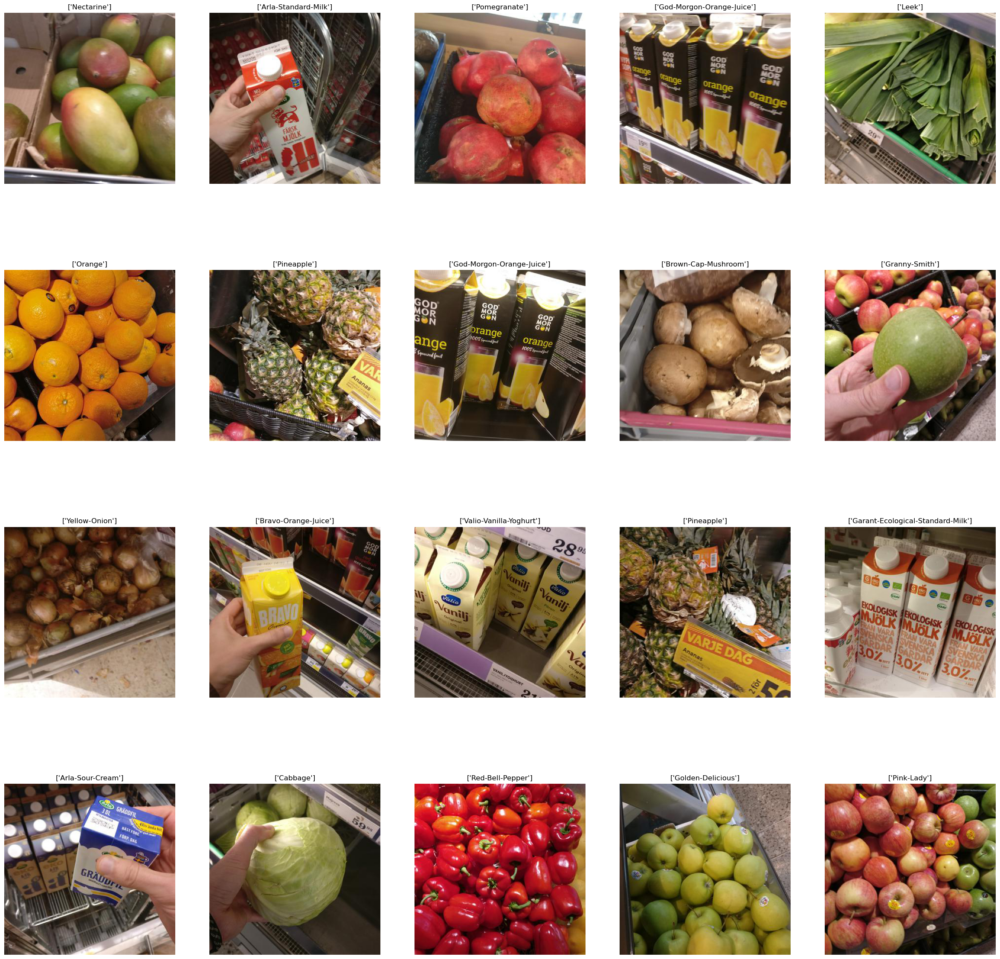

In [29]:
path_validacion = '/Users/jacar/OneDrive/Documentos/Maestria/Ciencia de datos aplicada/Talleres/Taller-2/GroceryStoreDataset-master/dataset/val' 
imagenes=[]
for directorio, subdirectorios, archivos in os.walk(path_validacion):
    for archivo in archivos:
        if archivo.endswith('.jpg') or archivo.endswith('.png'):
            archivo_path = os.path.join(directorio, archivo)
            imagenes.append(archivo_path.replace('\\','/'))


imagenes = random.sample(imagenes, 20)
#imagenes = [item for item in imagenes if 'Yoggi-Vanilla' in item][0:5]
cont=0
plt.figure(figsize=(30, 30))
for i in imagenes : 
    img_path = i
    img = image.load_img(img_path, target_size=(348, 348))  
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0
    prediccion = model.predict(img_array)
    clase_predicha = np.argmax(prediccion, axis=1)
    #print("Clase predicha:", clase_predicha[0])

    clave = [clave for clave, valor in class_names.items() if valor == clase_predicha]
    ax = plt.subplot(4, 5,cont+1)
    plt.imshow(np.squeeze(img_array))
    plt.title(clave)
    plt.axis("off")
    cont+= 1


plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


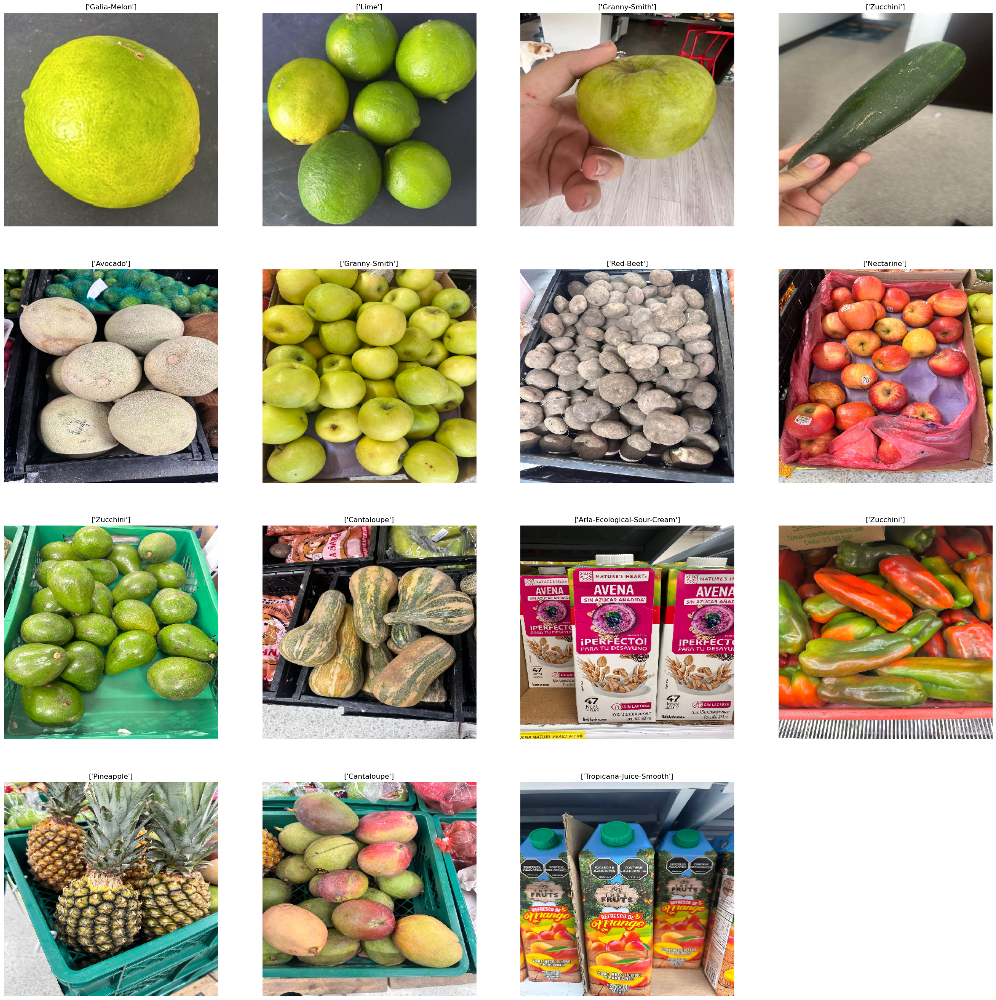

In [60]:
path_validacion = '/Users/jacar/OneDrive/Documentos/Maestria/Ciencia de datos aplicada/Talleres/Taller-2/Imagenes_prueba/' 
imagenes=[]
for directorio, subdirectorios, archivos in os.walk(path_validacion):
    for archivo in archivos:
        if archivo.endswith('.jpeg') or archivo.endswith('.png'):
            archivo_path = os.path.join(directorio, archivo)
            imagenes.append(archivo_path.replace('\\','/'))
imagenes
#imagenes = [item for item in imagenes if 'Yoggi-Vanilla' in item][0:5]
cont=0
plt.figure(figsize=(30, 30))
for i in imagenes : 
    img_path = i
    img = image.load_img(img_path, target_size=(348, 348))  
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0
    prediccion = model.predict(img_array)
    clase_predicha = np.argmax(prediccion, axis=1)
    #print("Clase predicha:", clase_predicha[0])

    clave = [clave for clave, valor in class_names.items() if valor == clase_predicha]
    ax = plt.subplot(4, 4,cont+1)
    plt.imshow(np.squeeze(img_array))
    plt.title(clave)
    plt.axis("off")
    cont+= 1